In [1]:
from keras.models import load_model
from numpy import load
from numpy import expand_dims
from numpy import load
import tensorflow as tf
import os

from os.path import join
import numpy as np
import re
import os
import matplotlib.pyplot as plt
from numpy import savez_compressed

import cv2
import math
import numpy as np
import skimage.measure as skm
from skimage.metrics import structural_similarity as ssim

from skimage.metrics import structural_similarity as ssim

In [ ]:
modelo_prueba = load_model('/content/drive/MyDrive/model_pix2pix_norma_395460.h5', compile=False)

In [ ]:
modelo_prueba.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 512, 512, 1)]        0         []                            
                                                                                                  
 conv2d_6 (Conv2D)           (None, 256, 256, 64)         1088      ['input_3[0][0]']             
                                                                                                  
 leaky_re_lu_5 (LeakyReLU)   (None, 256, 256, 64)         0         ['conv2d_6[0][0]']            
                                                                                                  
 conv2d_7 (Conv2D)           (None, 128, 128, 128)        131200    ['leaky_re_lu_5[0][0]']       
                                                                                            

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:

#%%
def load_real_samples(filename):
 data = load(filename)
 x1 = data['inputs_amplitud']
 x1 = (x1 - 127.5) / 127.5
 y1 = data['targets_amplitud']
 y1 = (y1 - 127.5) / 127.5

 return x1,y1


#%%
#hacerlo para cada set de val- predict- real
dataset_vali = load_real_samples('dataset_solap.npz')
# set_real =  load_real_samples('dataset_real.npz')
#%%
# muetsras originales
y_t = dataset_vali[1]
print(y_t.shape)
#%%
#para la prediccion, entrada con copia
val_solap = dataset_vali[0]
print(val_solap.shape)

(24, 512, 512, 1)
(24, 512, 512, 1)


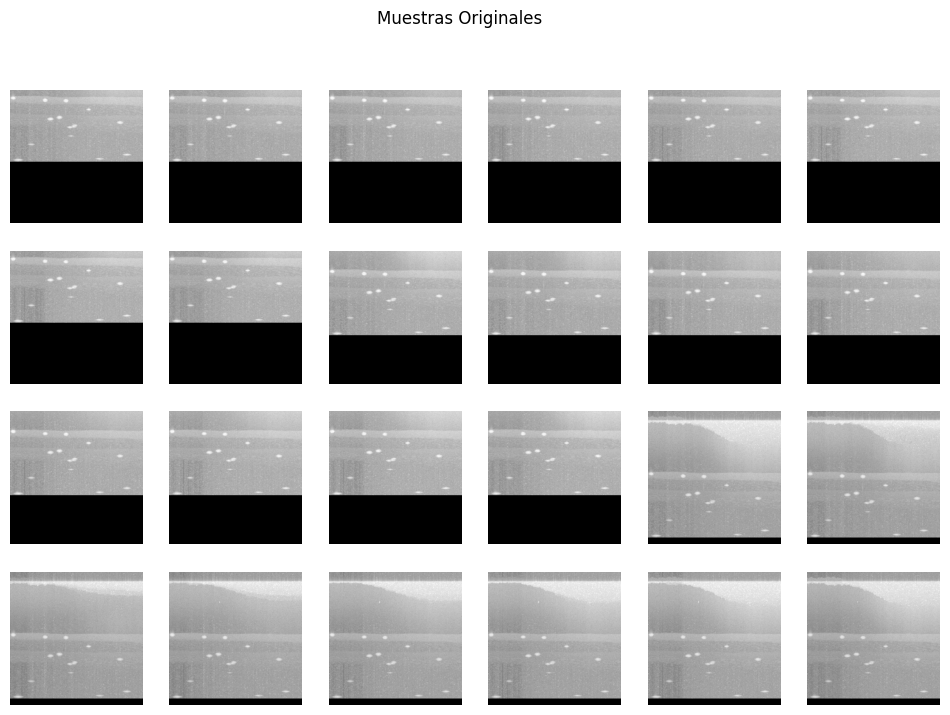

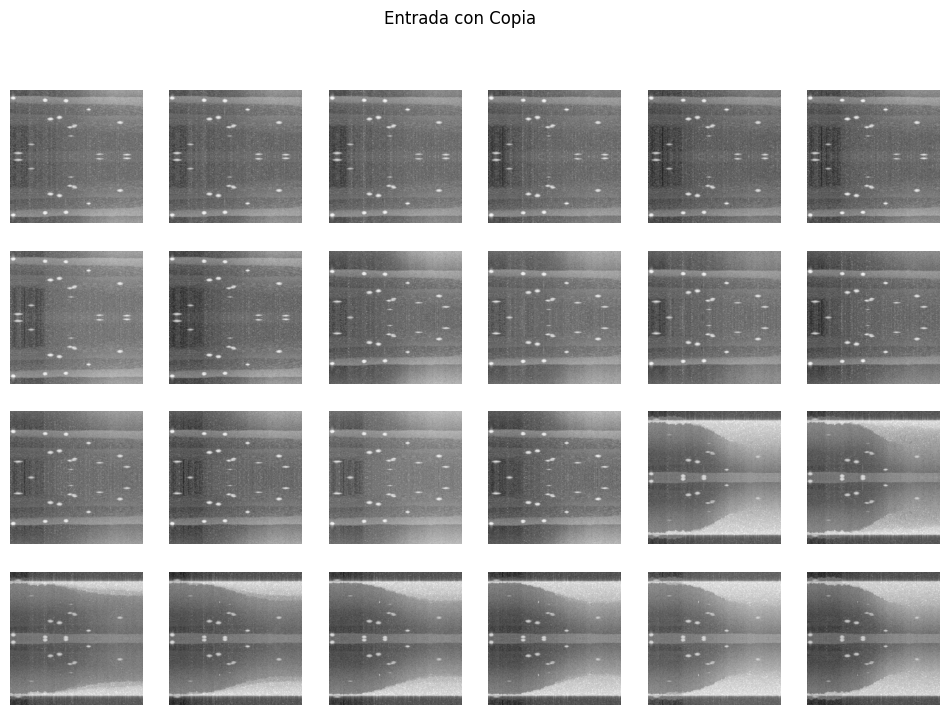

In [6]:
# Función para graficar muestras ajustada para mostrar 24 muestras en una cuadrícula
def plot_samples(samples, title, num_samples=24):
    # Calcular el número de filas y columnas para 24 muestras
    num_columns = 6
    num_rows = num_samples // num_columns + (num_samples % num_columns > 0)

    plt.figure(figsize=(2 * num_columns, 2 * num_rows))  # Ajustar el tamaño de la figura
    for i in range(num_samples):
        plt.subplot(num_rows, num_columns, i+1)
        plt.axis('off')
        # Asumiendo que las muestras son imágenes en escala de grises
        plt.imshow(samples[i], cmap='gray')
    plt.suptitle(title)
    plt.show()

# Asegúrate de que y_t y val_solap tienen al menos 24 muestras antes de llamar a esta función
# Graficar 24 muestras originales
plot_samples(y_t, 'Muestras Originales', 24)

# Graficar 24 muestras de entrada con copia
plot_samples(val_solap, 'Entrada con Copia', 24)

1/1 [==============================] - 2s 2s/step
Predicción con modelo 395460: (1, 512, 512, 1)


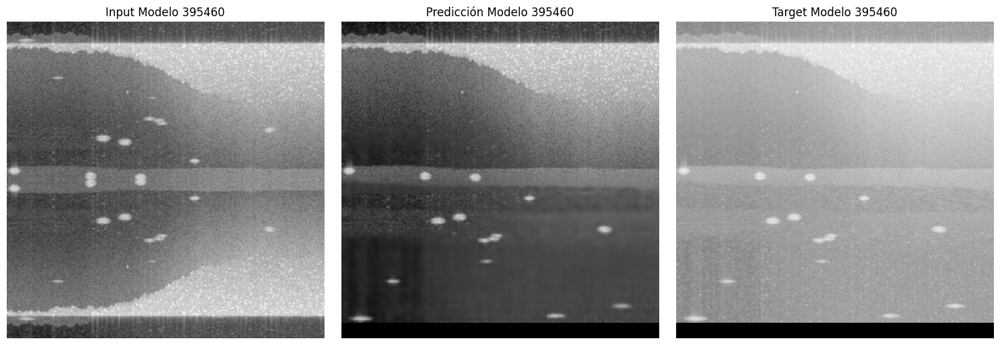

1/1 [==============================] - 3s 3s/step
Predicción con modelo 461370: (1, 512, 512, 1)


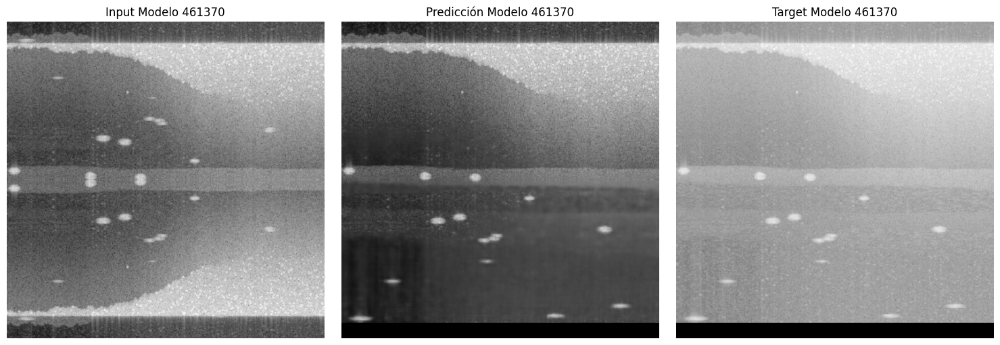

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import re  # Para expresiones regulares

# Lista de rutas a los archivos .h5 de los modelos
modelos_h5 = ['/content/drive/MyDrive/model_pix2pix_norma_395460.h5',
              '/content/drive/MyDrive/model_pix2pix_norma_461370.h5']

# Seleccionar la última muestra de val_solap
ultima_muestra = val_solap[-1:]  # Esto mantiene las dimensiones necesarias para la predicción

for modelo_path in modelos_h5:
    # Extraer el número del modelo usando expresiones regulares
    numero_modelo = re.search(r'norma_(\d+)', modelo_path).group(1)

    # Cargar el modelo
    modelo = load_model(modelo_path, compile=False)

    # Realizar la predicción con el modelo cargado
    prediccion = modelo.predict(ultima_muestra)

    # Visualizar la forma de la predicción
    print(f'Predicción con modelo {numero_modelo}: {prediccion.shape}')

    # Visualizar input, predicción y target
    plt.figure(figsize=(15, 5))

    # Mostrar la última muestra de val_solap (input)
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(ultima_muestra), cmap='gray')
    plt.title(f'Input Modelo {numero_modelo}')
    plt.axis('off')

    # Mostrar la predicción
    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(prediccion), cmap='gray')
    plt.title(f'Predicción Modelo {numero_modelo}')
    plt.axis('off')

    # Mostrar el target de la última muestra
    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(y_t[-1:]), cmap='gray')  # Asumiendo que y_t está indexado de la misma manera que val_solap
    plt.title(f'Target Modelo {numero_modelo}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
import pandas as pd
import numpy as np
import math
from skimage import measure as skm
from tensorflow.keras.models import load_model


In [10]:
def psnr(original, reconstructed):
    """Calcula la Relación Señal-Ruido de Pico (PSNR) entre dos imágenes"""
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr_value = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr_value

def mae(original, reconstructed):
    """Calcula el Error Medio Absoluto (MAE) entre dos imágenes"""
    mae_value = np.mean(np.abs(original - reconstructed))
    return mae_value

def ssim(original, reconstructed):
    """Calcula el Índice de Similitud Estructural (SSIM) entre dos imágenes"""
    ssim_value = skm.structural_similarity(original, reconstructed, channel_axis=-1)
    return ssim_value

# Para Histogramas
def dot_product_histograms(hist1, hist2):
    # Asegúrate de que los histogramas estén normalizados
    hist1_normalized = hist1 / np.sum(hist1)
    hist2_normalized = hist2 / np.sum(hist2)
    # Producto punto
    return np.dot(hist1_normalized.flatten(), hist2_normalized.flatten())

# Para Imágenes Directamente
def dot_product_images(img1, img2):
    # Aplanar las imágenes
    img1_flattened = img1.flatten()
    img2_flattened = img2.flatten()
    # Producto punto
    return np.dot(img1_flattened, img2_flattened)



1/1 [==============================] - 4s 4s/step


<ipython-input-32-c87b22737ef2>:32: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_value = skm.structural_similarity(original, reconstructed, multichannel=True)


Modelo 395460:
PSNR: 82.63
MAE: 0.01
SSIM: 0.9744
Dot Product: 66092.53


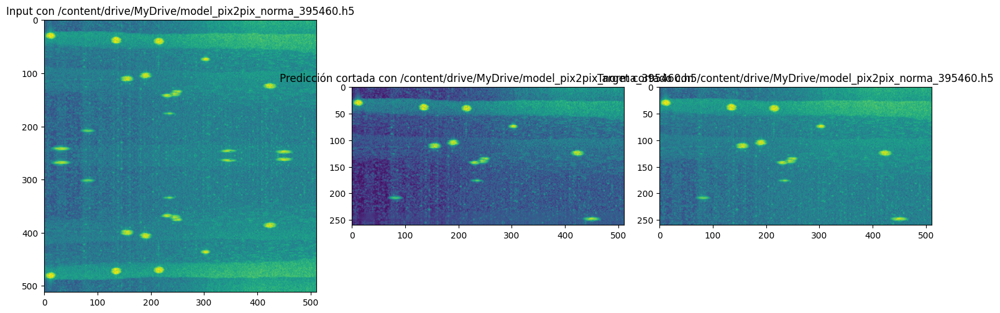

1/1 [==============================] - 2s 2s/step
Modelo 461370:
PSNR: 84.44
MAE: 0.01
SSIM: 0.9774
Dot Product: 65172.56


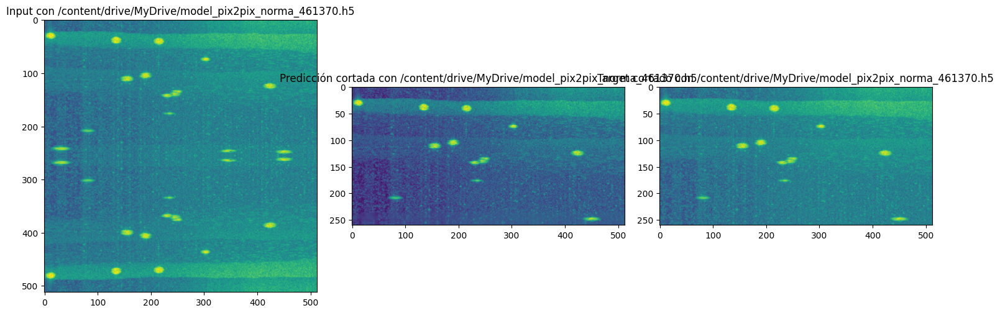

1/1 [==============================] - 3s 3s/step
Modelo 065910:
PSNR: 82.21
MAE: 0.01
SSIM: 0.9651
Dot Product: 65201.92


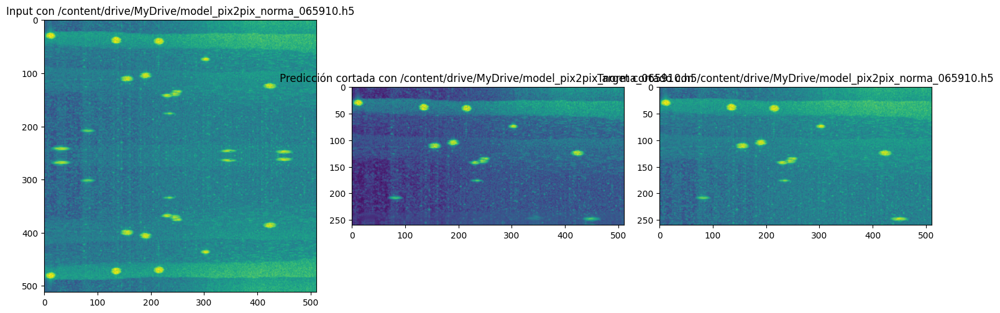

In [32]:
import tensorflow as tf
import cv2  # Asegúrate de tener OpenCV instalado para cv2
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import re
import math
import skimage.metrics as skm  # Importamos SSIM de scikit-image

# Lista de rutas a los archivos .h5 de los modelos
modelos_h5 = ['/content/drive/MyDrive/model_pix2pix_norma_395460.h5',
              '/content/drive/MyDrive/model_pix2pix_norma_461370.h5',
              '/content/drive/MyDrive/model_pix2pix_norma_065910.h5']

# Definir funciones de métricas
def psnr(original, reconstructed):
    """Calcula la Relación Señal-Ruido de Pico (PSNR) entre dos imágenes"""
    mse = np.mean((original - reconstructed) ** 2)
    if mse == 0:
        return float('inf')
    max_pixel = 255.0
    psnr_value = 20 * math.log10(max_pixel / math.sqrt(mse))
    return psnr_value

def mae(original, reconstructed):
    """Calcula el Error Medio Absoluto (MAE) entre dos imágenes"""
    mae_value = np.mean(np.abs(original - reconstructed))
    return mae_value

def ssim(original, reconstructed):
    """Calcula el Índice de Similitud Estructural (SSIM) entre dos imágenes"""
    ssim_value = skm.structural_similarity(original, reconstructed, multichannel=True)
    return ssim_value

def dot_product_images(img1, img2):
    """Calcula el producto punto entre dos imágenes aplanadas"""
    img1_flattened = img1.flatten()
    img2_flattened = img2.flatten()
    dot_product = np.dot(img1_flattened, img2_flattened)
    return dot_product

# Función para recortar la imagen al centro con las dimensiones deseadas
def crop_to_top(image, crop_height, crop_width):
    # Asegurar que las dimensiones del recorte no superen las dimensiones originales de la imagen
    crop_height = min(crop_height, image.shape[0])
    crop_width = min(crop_width, image.shape[1])

    # Calcular los límites para el recorte
    start_y = 0  # Empieza desde el borde superior
    end_y = min(crop_height, image.shape[0])  # Hasta el límite de la altura de recorte
    start_x = 0  # Empieza desde el borde izquierdo
    end_x = min(crop_width, image.shape[1])  # Hasta el límite de la anchura de recorte

    # Realizar el recorte
    cropped_image = image[start_y:end_y, start_x:end_x]

    return cropped_image

# Seleccionar la primera muestra de val_solap y y_t
primera_muestra = val_solap[:1]  # Esto mantiene las dimensiones necesarias para la predicción
target = y_t[:1]

for modelo_path in modelos_h5:
    # Cargar el modelo
    modelo = load_model(modelo_path, compile=False)

    numero_modelo = re.search(r'norma_(\d+)', modelo_path).group(1)

    # Realizar la predicción con el modelo cargado
    prediccion = modelo.predict(primera_muestra)

    # Recortar las imágenes al centro con las dimensiones deseadas
    prediccion_cortada = crop_to_top(np.squeeze(prediccion), 260, 512)
    target_cortado = crop_to_top(np.squeeze(target), 260, 512)

    # Calcular métricas
    psnr_value = psnr(target_cortado, prediccion_cortada)
    mae_value = mae(target_cortado, prediccion_cortada)
    ssim_value = ssim(target_cortado, prediccion_cortada)
    dot_product_value = dot_product_images(target_cortado, prediccion_cortada)

    # Mostrar resultados
    print(f'Modelo {numero_modelo}:')
    print(f'PSNR: {psnr_value:.2f}')
    print(f'MAE: {mae_value:.2f}')
    print(f'SSIM: {ssim_value:.4f}')
    print(f'Dot Product: {dot_product_value:.2f}')

    # Mostrar imágenes
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(primera_muestra))
    plt.title(f'Input con {modelo_path}')
    plt.axis('on')

    plt.subplot(1, 3, 2)
    plt.imshow(prediccion_cortada)
    plt.title(f'Predicción cortada con {modelo_path}')
    plt.axis('on')

    plt.subplot(1, 3, 3)
    plt.imshow(target_cortado)
    plt.title(f'Target cortado con {modelo_path}')
    plt.axis('on')

    plt.tight_layout()
    plt.show()


1/1 [==============================] - 3s 3s/step


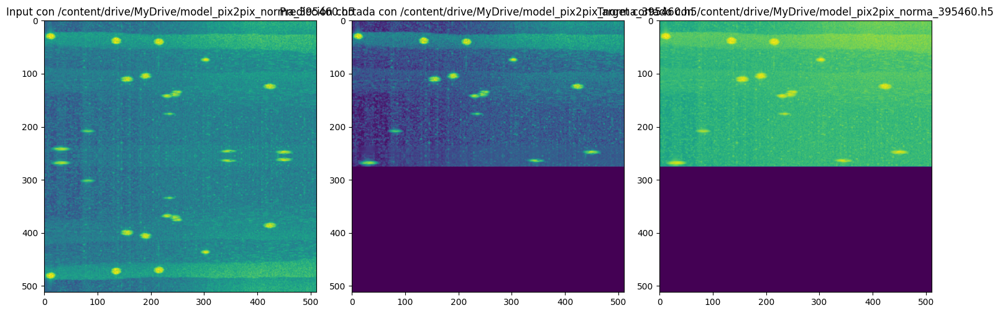

1/1 [==============================] - 2s 2s/step


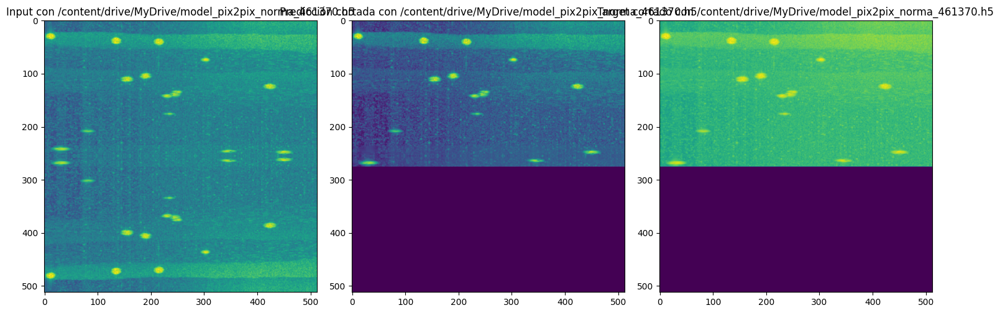

1/1 [==============================] - 2s 2s/step


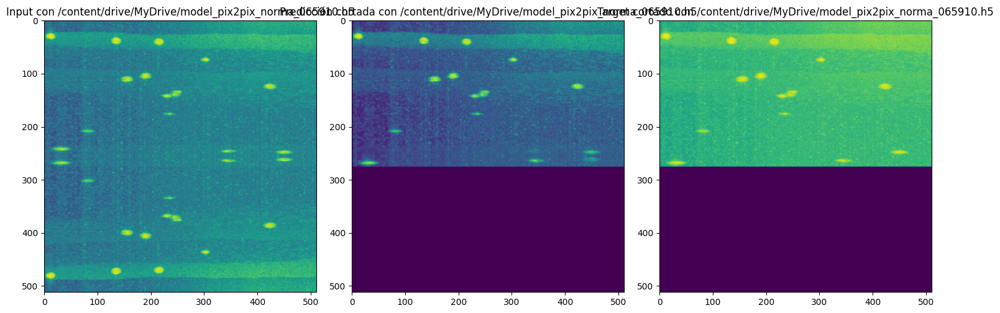

In [29]:
import tensorflow as tf
import cv2  # Asegúrate de tener OpenCV instalado para cv2
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import re

# Lista de rutas a los archivos .h5 de los modelos
modelos_h5 = ['/content/drive/MyDrive/model_pix2pix_norma_395460.h5',
              '/content/drive/MyDrive/model_pix2pix_norma_461370.h5',
              '/content/drive/MyDrive/model_pix2pix_norma_065910.h5']

# Seleccionar la primera muestra de val_solap y y_t
primera_muestra = val_solap[:1]  # Esto mantiene las dimensiones necesarias para la predicción
target = y_t[:1]

# Función para recortar áreas válidas (no vacías)
def crop_valid_area(image):
    # Encuentra las filas y columnas que no están completamente en negro
    mask = image > 0
    if np.any(mask):  # Verificar que hay al menos un pixel válido
        coords = np.argwhere(mask)
        x0, y0 = coords.min(axis=0)
        x1, y1 = coords.max(axis=0) + 1
        return image[x0:x1, y0:y1]
    else:
        return image  # Devolver la imagen original si no hay áreas válidas

for modelo_path in modelos_h5:
    # Cargar el modelo
    modelo = load_model(modelo_path, compile=False)

    numero_modelo = re.search(r'norma_(\d+)', modelo_path).group(1)

    # Realizar la predicción con el modelo cargado
    prediccion = modelo.predict(primera_muestra)

    # Recortar áreas válidas (no vacías)
    prediccion_cortada = crop_valid_area(np.squeeze(prediccion))
    target_cortado = crop_valid_area(np.squeeze(target))

    # Verificar si hay áreas válidas después del recorte
    if prediccion_cortada.size == 0 or target_cortado.size == 0:
        print(f'El modelo {numero_modelo} tiene una predicción o target vacío después del recorte.')
        continue

    plt.figure(figsize=(15, 5))

    # Mostrar la primera muestra de val_solap (input)
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(primera_muestra))
    plt.title(f'Input con {modelo_path}')
    plt.axis('on')

    # Mostrar la predicción cortada
    plt.subplot(1, 3, 2)
    plt.imshow(prediccion_cortada)
    plt.title(f'Predicción cortada con {modelo_path}')
    plt.axis('on')

    # Mostrar el target cortado
    plt.subplot(1, 3, 3)
    plt.imshow(target_cortado)
    plt.title(f'Target cortado con {modelo_path}')
    plt.axis('on')

    plt.tight_layout()
    plt.show()


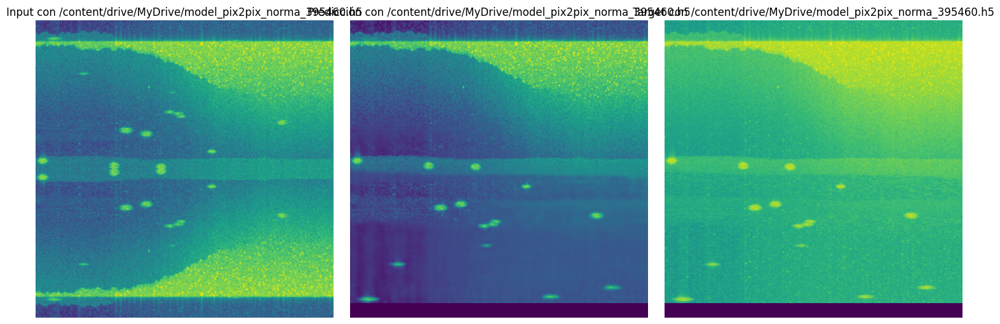

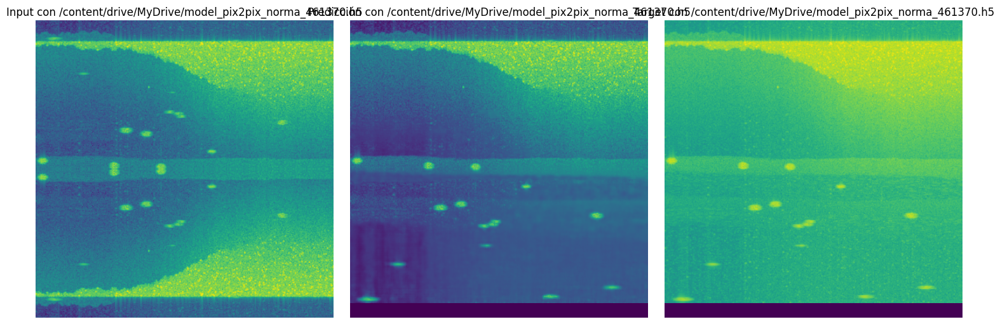

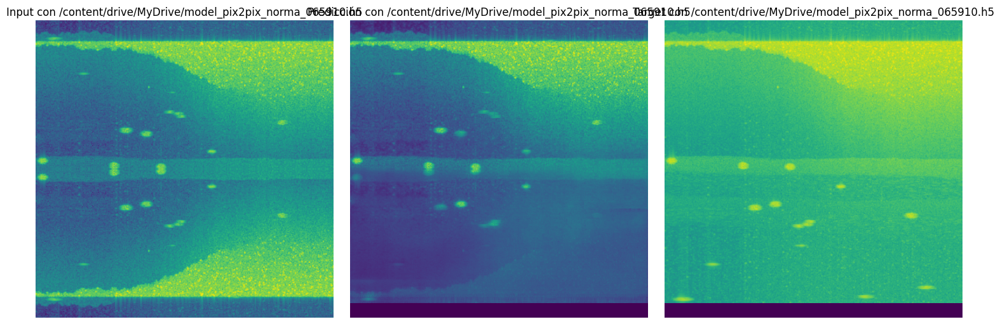

                          Modelo       PSNR       MAE      SSIM  \
0  model_pix2pix_norma_395460.h5  60.321739  0.077190  0.810880   
1  model_pix2pix_norma_461370.h5  60.323098  0.076444  0.812162   
2  model_pix2pix_norma_065910.h5  60.194867  0.086387  0.780851   

   Dot Product Histograms  
0                     1.0  
1                     1.0  
2                     1.0  


In [15]:

ultima_muestra = val_solap[-1:]  # Esto mantiene las dimensiones necesarias para la predicción
target = y_t[-1:]

metricas_list = []

for modelo_path in modelos_h5:
    # Cargar el modelo
    modelo = load_model(modelo_path, compile=False)

    # Definir la función de predicción fuera del bucle
    @tf.function
    def predict(model, data):
        return model(data)

    # Realizar la predicción con el modelo cargado
    prediccion = predict(modelo, ultima_muestra).numpy()

    # Calcular métricas
    psnr_value = psnr(np.squeeze(target), np.squeeze(prediccion))
    mae_value = mae(np.squeeze(target), np.squeeze(prediccion))
    ssim_value = ssim(np.squeeze(target), np.squeeze(prediccion))
    # Calcular nuevas métricas
    # Calcular histogramas y luego el producto punto de los histogramas
    hist_target, _ = np.histogram(np.squeeze(target).flatten(), bins=256, range=[0, 255])
    hist_prediccion, _ = np.histogram(np.squeeze(prediccion).flatten(), bins=256, range=[0, 255])
    dot_product_hist_value = dot_product_histograms(hist_target, hist_prediccion)

    # Calcular el producto punto directamente de las imágenes
    dot_product_images_value = dot_product_images(np.squeeze(target), np.squeeze(prediccion))
    # # Convertir target y prediccion a HSV y calcular la distancia de Bhattacharyya
    # target_hsv = cv2.cvtColor(np.squeeze(target).astype('float32'), cv2.COLOR_BGR2HSV)
    # prediccion_hsv = cv2.cvtColor(np.squeeze(prediccion).astype('float32'), cv2.COLOR_BGR2HSV)
    # hist_target_hsv = cv2.calcHist([target_hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])
    # cv2.normalize(hist_target_hsv, hist_target_hsv, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    # hist_prediccion_hsv = cv2.calcHist([prediccion_hsv], [0, 1], None, [180, 256], [0, 180, 0, 256])
    # cv2.normalize(hist_prediccion_hsv, hist_prediccion_hsv, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)
    # bhattacharyya_distance = cv2.compareHist(hist_target_hsv, hist_prediccion_hsv, cv2.HISTCMP_BHATTACHARYYA)

    # Calcular el valor Chi-cuadrado entre los histogramas HSV
    # chi_sqr_value = cv2.compareHist(hist_target_hsv, hist_prediccion_hsv, cv2.HISTCMP_CHISQR)

    # Agregar las métricas a la lista
    metricas_list.append({
        'Modelo': modelo_path.split('/')[-1],
        'PSNR': psnr_value,
        'MAE': mae_value,
        'SSIM': ssim_value,
        'Dot Product Histograms': dot_product_hist_value
        # 'Dot Product Images': dot_product_images_value,
        # 'Bhattacharyya Distance': bhattacharyya_distance,
        # 'Chi-Square': chi_sqr_value
    })
    # Visualizar input, predicción y target
    plt.figure(figsize=(15, 5))

    # Mostrar la última muestra de val_solap (input)
    plt.subplot(1, 3, 1)
    plt.imshow(np.squeeze(ultima_muestra))
    plt.title(f'Input con {modelo_path}')
    plt.axis('off')

    # Mostrar la predicción
    plt.subplot(1, 3, 2)
    plt.imshow(np.squeeze(prediccion))
    plt.title(f'Predicción con {modelo_path}')
    plt.axis('off')

    # Mostrar el target de la última muestra
    plt.subplot(1, 3, 3)
    plt.imshow(np.squeeze(target))
    plt.title(f'Target con {modelo_path}')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Convertir la lista de métricas en un DataFrame
metricas_df = pd.DataFrame(metricas_list)

# Mostrar el DataFrame con las métricas
print(metricas_df)
